#  Miêu tả
## Mục tiêu của cuộc thi
* Trong cuộc thi “bắt đầu” này, bạn sẽ sử dụng tính năng dự báo chuỗi thời gian để dự báo doanh số bán hàng tại cửa hàng dựa trên dữ liệu từ Corporación Favorita, một nhà bán lẻ tạp hóa lớn có trụ sở tại Ecuador.

* Cụ thể, bạn sẽ xây dựng một mô hình dự đoán chính xác hơn doanh số bán hàng của hàng nghìn mặt hàng được bán tại các cửa hàng Favorita khác nhau. Bạn sẽ thực hành các kỹ năng học máy của mình với tập dữ liệu đào tạo dễ tiếp cận về ngày, cửa hàng và thông tin mặt hàng, chương trình khuyến mãi và doanh số bán hàng.

# 1.LOAD DATA

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
train = pd.read_csv('./data/train.csv')
test = pd.read_csv('./data/test.csv')

print('The dimension of the train dataset is:', train.shape)
print('The dimension of the test dataset is:', test.shape)

The dimension of the train dataset is: (3000888, 6)
The dimension of the test dataset is: (28512, 5)


In [3]:
print(train.head())
print(test.head())

   id        date  store_nbr      family  sales  onpromotion
0   0  2013-01-01          1  AUTOMOTIVE    0.0            0
1   1  2013-01-01          1   BABY CARE    0.0            0
2   2  2013-01-01          1      BEAUTY    0.0            0
3   3  2013-01-01          1   BEVERAGES    0.0            0
4   4  2013-01-01          1       BOOKS    0.0            0
        id        date  store_nbr      family  onpromotion
0  3000888  2017-08-16          1  AUTOMOTIVE            0
1  3000889  2017-08-16          1   BABY CARE            0
2  3000890  2017-08-16          1      BEAUTY            2
3  3000891  2017-08-16          1   BEVERAGES           20
4  3000892  2017-08-16          1       BOOKS            0


In [4]:
#train.drop(columns=["id"],inplace=True)
#test.drop(columns=["id"],inplace=True)

   ## 1.2 LOAD  OTHER SUPPORTING DATASETS

In [5]:
holidays =  pd.read_csv('./data/holidays_events.csv')
stores =  pd.read_csv('./data/stores.csv')
transactions = pd.read_csv('./data/transactions.csv')
oil = pd.read_csv('./data/oil.csv')


In [6]:
print(holidays.head())
print(stores.head())
print(transactions.head())
print(oil.head())

         date     type    locale locale_name                    description  \
0  2012-03-02  Holiday     Local       Manta             Fundacion de Manta   
1  2012-04-01  Holiday  Regional    Cotopaxi  Provincializacion de Cotopaxi   
2  2012-04-12  Holiday     Local      Cuenca            Fundacion de Cuenca   
3  2012-04-14  Holiday     Local    Libertad      Cantonizacion de Libertad   
4  2012-04-21  Holiday     Local    Riobamba      Cantonizacion de Riobamba   

   transferred  
0        False  
1        False  
2        False  
3        False  
4        False  
   store_nbr           city                           state type  cluster
0          1          Quito                       Pichincha    D       13
1          2          Quito                       Pichincha    D       13
2          3          Quito                       Pichincha    D        8
3          4          Quito                       Pichincha    D        9
4          5  Santo Domingo  Santo Domingo de los Tsa

# 2. EXPLORATORY DATA


In [7]:
def info(data):
    for col in data.columns:
        if data[col].dtype == 'object':  # Kiểm tra nếu cột không phải là số
            unique_vals = data[col].unique()
            print(f"{col}: {unique_vals}")
        else:  # Nếu cột là dữ liệu số
            print(f"{col}:")
            print(f"Missing values: {data[col].isnull().sum()}")  
            print(data[col].describe())


In [8]:
info(train)

id:
Missing values: 0
count    3.000888e+06
mean     1.500444e+06
std      8.662819e+05
min      0.000000e+00
25%      7.502218e+05
50%      1.500444e+06
75%      2.250665e+06
max      3.000887e+06
Name: id, dtype: float64
date: ['2013-01-01' '2013-01-02' '2013-01-03' ... '2017-08-13' '2017-08-14'
 '2017-08-15']
store_nbr:
Missing values: 0
count    3.000888e+06
mean     2.750000e+01
std      1.558579e+01
min      1.000000e+00
25%      1.400000e+01
50%      2.750000e+01
75%      4.100000e+01
max      5.400000e+01
Name: store_nbr, dtype: float64
family: ['AUTOMOTIVE' 'BABY CARE' 'BEAUTY' 'BEVERAGES' 'BOOKS' 'BREAD/BAKERY'
 'CELEBRATION' 'CLEANING' 'DAIRY' 'DELI' 'EGGS' 'FROZEN FOODS' 'GROCERY I'
 'GROCERY II' 'HARDWARE' 'HOME AND KITCHEN I' 'HOME AND KITCHEN II'
 'HOME APPLIANCES' 'HOME CARE' 'LADIESWEAR' 'LAWN AND GARDEN' 'LINGERIE'
 'LIQUOR,WINE,BEER' 'MAGAZINES' 'MEATS' 'PERSONAL CARE' 'PET SUPPLIES'
 'PLAYERS AND ELECTRONICS' 'POULTRY' 'PREPARED FOODS' 'PRODUCE'
 'SCHOOL AND OFFICE 

In [9]:
info(holidays)

date: ['2012-03-02' '2012-04-01' '2012-04-12' '2012-04-14' '2012-04-21'
 '2012-05-12' '2012-06-23' '2012-06-25' '2012-07-03' '2012-07-23'
 '2012-08-05' '2012-08-10' '2012-08-15' '2012-08-24' '2012-09-28'
 '2012-10-07' '2012-10-09' '2012-10-12' '2012-11-02' '2012-11-03'
 '2012-11-06' '2012-11-07' '2012-11-10' '2012-11-11' '2012-11-12'
 '2012-12-05' '2012-12-06' '2012-12-08' '2012-12-21' '2012-12-22'
 '2012-12-23' '2012-12-24' '2012-12-25' '2012-12-26' '2012-12-31'
 '2013-01-01' '2013-01-05' '2013-01-12' '2013-02-11' '2013-02-12'
 '2013-03-02' '2013-04-01' '2013-04-12' '2013-04-14' '2013-04-21'
 '2013-04-29' '2013-05-01' '2013-05-11' '2013-05-12' '2013-05-24'
 '2013-06-23' '2013-06-25' '2013-07-03' '2013-07-23' '2013-07-24'
 '2013-07-25' '2013-08-05' '2013-08-10' '2013-08-15' '2013-08-24'
 '2013-09-28' '2013-10-07' '2013-10-09' '2013-10-11' '2013-11-02'
 '2013-11-03' '2013-11-06' '2013-11-07' '2013-11-10' '2013-11-11'
 '2013-11-12' '2013-12-05' '2013-12-06' '2013-12-08' '2013-12-21'
 '20

In [10]:
info(stores)

store_nbr:
Missing values: 0
count    54.000000
mean     27.500000
std      15.732133
min       1.000000
25%      14.250000
50%      27.500000
75%      40.750000
max      54.000000
Name: store_nbr, dtype: float64
city: ['Quito' 'Santo Domingo' 'Cayambe' 'Latacunga' 'Riobamba' 'Ibarra'
 'Guaranda' 'Puyo' 'Ambato' 'Guayaquil' 'Salinas' 'Daule' 'Babahoyo'
 'Quevedo' 'Playas' 'Libertad' 'Cuenca' 'Loja' 'Machala' 'Esmeraldas'
 'Manta' 'El Carmen']
state: ['Pichincha' 'Santo Domingo de los Tsachilas' 'Cotopaxi' 'Chimborazo'
 'Imbabura' 'Bolivar' 'Pastaza' 'Tungurahua' 'Guayas' 'Santa Elena'
 'Los Rios' 'Azuay' 'Loja' 'El Oro' 'Esmeraldas' 'Manabi']
type: ['D' 'B' 'C' 'E' 'A']
cluster:
Missing values: 0
count    54.000000
mean      8.481481
std       4.693395
min       1.000000
25%       4.000000
50%       8.500000
75%      13.000000
max      17.000000
Name: cluster, dtype: float64


In [11]:
info(transactions)

date: ['2013-01-01' '2013-01-02' '2013-01-03' ... '2017-08-13' '2017-08-14'
 '2017-08-15']
store_nbr:
Missing values: 0
count    83488.000000
mean        26.939237
std         15.608204
min          1.000000
25%         13.000000
50%         27.000000
75%         40.000000
max         54.000000
Name: store_nbr, dtype: float64
transactions:
Missing values: 0
count    83488.000000
mean      1694.602158
std        963.286644
min          5.000000
25%       1046.000000
50%       1393.000000
75%       2079.000000
max       8359.000000
Name: transactions, dtype: float64


In [12]:
info(oil)

date: ['2013-01-01' '2013-01-02' '2013-01-03' ... '2017-08-29' '2017-08-30'
 '2017-08-31']
dcoilwtico:
Missing values: 43
count    1175.000000
mean       67.714366
std        25.630476
min        26.190000
25%        46.405000
50%        53.190000
75%        95.660000
max       110.620000
Name: dcoilwtico, dtype: float64


## 2.2 Dataset info

Dữ liệu đào tạo(train dataset), bao gồm chuỗi thời gian của các tính năng store_nbr, family và onpromotion cũng như doanh số mục tiêu.
* store_nbr: xác định cửa hàng nơi sản phẩm được bán.
* family: xác định loại sản phẩm được bán.
* sales: bán hàng cho biết tổng doanh số bán hàng của một dòng sản phẩm tại một cửa hàng cụ thể vào một ngày nhất định. Có thể có giá trị phân số vì sản phẩm có thể được bán theo đơn vị phân số (ví dụ: 1,5 kg phô mai thay vì 1 túi khoai tây chiên).
* onpromotion: cung cấp tổng số mặt hàng trong dòng sản phẩm đang được khuyến mãi tại cửa hàng vào một ngày nhất định.

Dữ liệu cửa hàng(stores)
* store_nbr: Số thứ tự (định danh) của cửa hàng.
* city: Thành phố nơi cửa hàng đặt.
* state: Tiểu bang hoặc vùng lãnh thổ nơi cửa hàng đặt.
* type: Loại cửa hàng
* cluster: Cụm hoặc nhóm của cửa hàng, có thể là một cách phân nhóm hoặc phân loại khác dựa trên các yếu tố như địa lý, loại cửa hàng, vv.

Dữ liệu kỳ nghỉ lễ (holidays)
* date: Ngày của sự kiện hoặc ngày lễ.
* type: Loại sự kiện hoặc ngày lễ, có thể là "Holiday" (Ngày lễ) hoặc "Event" (Sự kiện).
* locale: Địa điểm hoặc khu vực của sự kiện hoặc ngày lễ.
* locale_name: Tên của địa điểm hoặc khu vực.
* description: Mô tả chi tiết về sự kiện hoặc ngày lễ.
* transferred: Một cột đánh dấu xem ngày lễ đã được chuyển đổi chính thức từ ngày ban đầu hay không. Điều này có thể xảy ra khi một ngày lễ được chuyển đổi từ một ngày trong tuần sang một ngày khác để tạo ra một ngày nghỉ kéo dài hoặc thực hiện điều chỉnh lịch cho các mục đích khác.

Dữ liệu dầu (oil) (Ecuador là một quốc gia phụ thuộc vào dầu mỏ và nền kinh tế của nước này rất dễ bị tổn thương trước những cú sốc về giá dầu.)
* date: Ngày tương ứng với giá dầu được ghi nhận.
* dcoilwtico: Giá dầu WTI Crude Oil trong ngày đó.

Dư liệu giao dịch tại mỗi cửa hàng (transactions)
* date: Ngày tương ứng với số lượng giao dịch được ghi nhận.
* store_nbr: Số thứ tự (định danh) của cửa hàng.
* transactions: Số lượng giao dịch (bán hàng) được thực hiện tại cửa hàng đó trong ngày đó.

Ghi chú bổ sung Tiền lương trong khu vực công được trả hai tuần một lần vào ngày 15 và ngày cuối cùng của tháng. Doanh số bán hàng siêu thị có thể bị ảnh hưởng bởi điều này. Một trận động đất mạnh 7,8 độ richter xảy ra ở Ecuador vào ngày 16 tháng 4 năm 2016. Người dân tập hợp lại trong nỗ lực cứu trợ quyên góp nước và các sản phẩm cần thiết đầu tiên khác, điều này đã ảnh hưởng lớn đến doanh số bán hàng của siêu thị trong vài tuần sau trận động đất.

In [13]:
def set_date_index(data):
    # Chuyển đổi cột 'date' sang định dạng datetime và đặt làm index
    data['date'] = pd.to_datetime(data['date']).dt.to_period('D')
    data.set_index('date', inplace=True)
    
    return data
train = set_date_index(train)
test = set_date_index(test)
holidays = set_date_index(holidays)
transactions = set_date_index(transactions)
oil = set_date_index(oil)
average_sales = train.groupby('date')['sales'].mean()

## 2.3 Trend

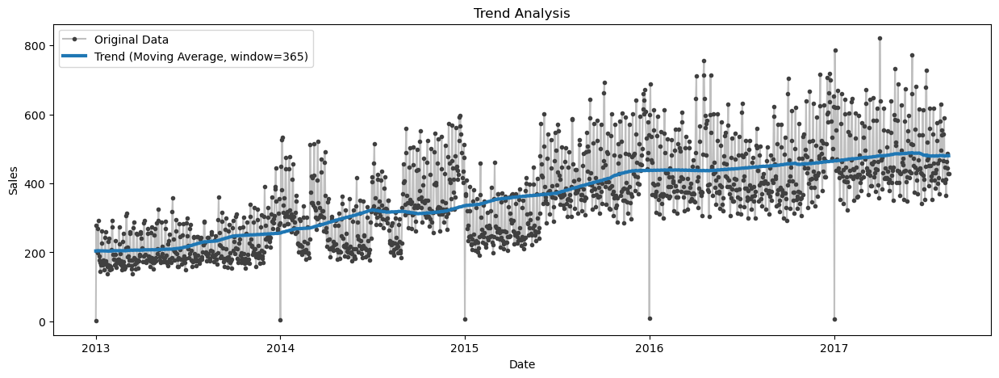

In [14]:
plot_params = dict(
    color="0.75",
    marker=".",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
)
trend = average_sales.rolling(
    window=365,
    center=True,
    min_periods=183,
).mean()
# Vẽ biểu đồ để hiển thị dữ liệu gốc và trend
plt.figure(figsize=(15, 5))
plt.plot(average_sales.index.to_timestamp(), average_sales, **plot_params, label='Original Data')
plt.plot(trend.index, trend, label=f'Trend (Moving Average, window={365})',linewidth=3)
plt.xlabel('Date')
plt.ylabel('Sales')
plt.title('Trend Analysis')
plt.legend()
plt.show()



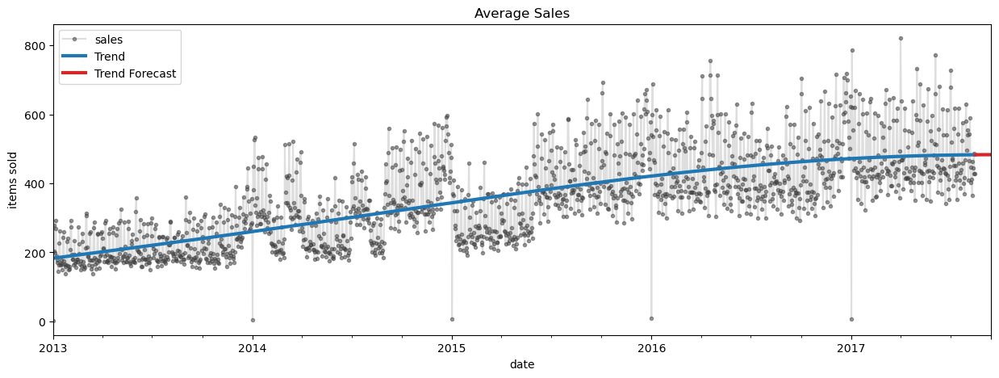

In [15]:
from statsmodels.tsa.deterministic import DeterministicProcess
from sklearn.linear_model import LinearRegression
y_trend=train.groupby('date')['sales'].mean()
dp = DeterministicProcess(index=y_trend.index, order=5)
X_trend = dp.in_sample()
X_fore_trend = dp.out_of_sample(steps=30)
model = LinearRegression()
model.fit(X_trend, y_trend)

y_pred_trend = pd.Series(model.predict(X_trend), index=X_trend.index)
y_fore_trend = pd.Series(model.predict(X_fore_trend), index=X_fore_trend.index)

plt.figure(figsize=(15, 5))
ax = y_trend.plot(**plot_params, alpha=0.5, title="Average Sales", ylabel="items sold")
ax = y_pred_trend.plot(ax=ax, linewidth=3, label="Trend", color='C0')
ax = y_fore_trend.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C3')
ax.legend();

## 2.4 Seasonality

In [16]:
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess
from warnings import simplefilter
simplefilter("ignore")
# Set Matplotlib defaults
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 5))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)
%config InlineBackend.figure_format = 'retina'


def seasonal_plot(X, y, period, freq, ax=None):
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique(),)
    ax = sns.lineplot(
        x=freq,
        y=y,
        hue=period,
        data=X,
        ci=False,
        ax=ax,
        palette=palette,
        legend=False,
    )
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(
            name,
            xy=(1, y_),
            xytext=(6, 0),
            color=line.get_color(),
            xycoords=ax.get_yaxis_transform(),
            textcoords="offset points",
            size=14,
            va="center",
        )
    return ax


def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta("365D") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=30,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax
def lagplot(x, y=None, lag=1, standardize=False, ax=None, **kwargs):
    from matplotlib.offsetbox import AnchoredText
    x_ = x.shift(lag)
    if standardize:
        x_ = (x_ - x_.mean()) / x_.std()
    if y is not None:
        y_ = (y - y.mean()) / y.std() if standardize else y
    else:
        y_ = x
    corr = y_.corr(x_)
    if ax is None:
        fig, ax = plt.subplots()
    scatter_kws = dict(
        alpha=0.75,
        s=3,
    )
    line_kws = dict(color='C3', )
    ax = sns.regplot(x=x_,
                     y=y_,
                     scatter_kws=scatter_kws,
                     line_kws=line_kws,
                     lowess=True,
                     ax=ax,
                     **kwargs)
    at = AnchoredText(
        f"{corr:.2f}",
        prop=dict(size="large"),
        frameon=True,
        loc="upper left",
    )
    at.patch.set_boxstyle("square, pad=0.0")
    ax.add_artist(at)
    ax.set(title=f"Lag {lag}", xlabel=x_.name, ylabel=y_.name)
    return ax


def plot_lags(x, y=None, lags=6, nrows=1, lagplot_kwargs={}, **kwargs):
    import math
    kwargs.setdefault('nrows', nrows)
    kwargs.setdefault('ncols', math.ceil(lags / nrows))
    kwargs.setdefault('figsize', (kwargs['ncols'] * 2, nrows * 2 + 0.5))
    fig, axs = plt.subplots(sharex=True, sharey=True, squeeze=False, **kwargs)
    for ax, k in zip(fig.get_axes(), range(kwargs['nrows'] * kwargs['ncols'])):
        if k + 1 <= lags:
            ax = lagplot(x, y, lag=k + 1, ax=ax, **lagplot_kwargs)
            ax.set_title(f"Lag {k + 1}", fontdict=dict(fontsize=14))
            ax.set(xlabel="", ylabel="")
        else:
            ax.axis('off')
    plt.setp(axs[-1, :], xlabel=x.name)
    plt.setp(axs[:, 0], ylabel=y.name if y is not None else x.name)
    fig.tight_layout(w_pad=0.1, h_pad=0.1)
    return fig
def make_lags(ts, lags,name):
    return pd.concat(
        {
            f'{name}_lag_{i}': ts.shift(i)
            for i in range(1, lags + 1)
        },
        axis=1)
def make_multistep_target(ts, steps,name):
    return pd.concat(
        {f'{name}_step_{i + 1}': ts.shift(-i)
         for i in range(steps)},
        axis=1)


* 4 quí trong 1 năm: Thường thể hiện ở các chuỗi như GPD, kim ngạch xuất nhập khẩu,…

* 12 tháng trong 1 năm: Các chuỗi liên quan tới doanh thu, doanh số, du lịch, dịch vụ,…

* 7 ngày trong 1 tuần: Các chuỗi liên quan tới qui luật mua sắm, tiêu dùng, vui chơi giải trí,…

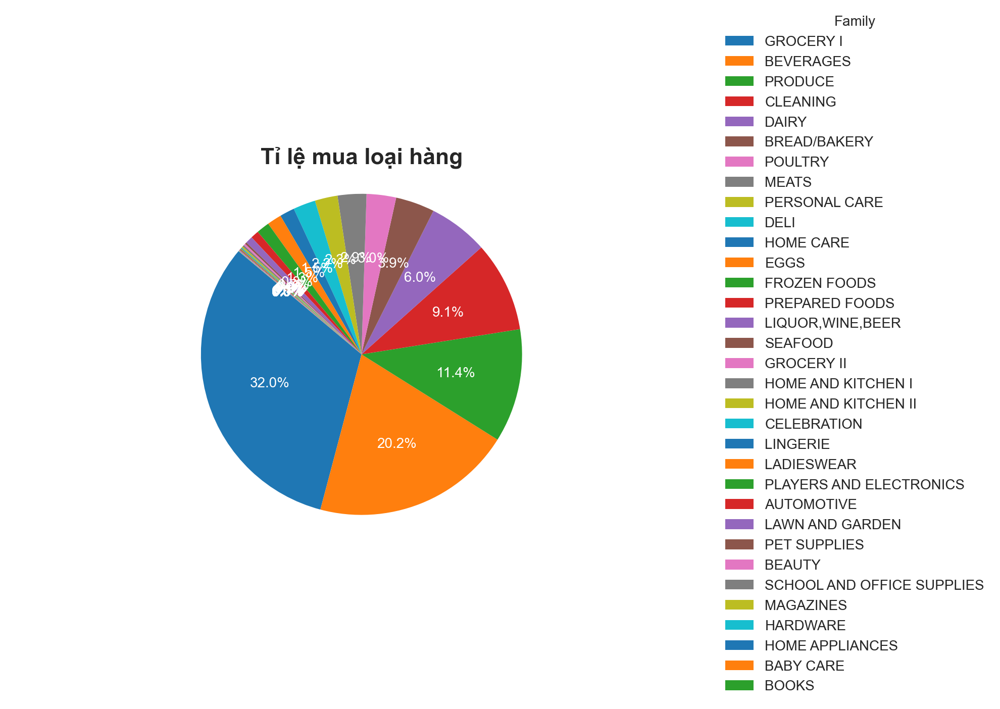

In [17]:
sales_by_family = train.groupby('family').sum()['sales']
total_sales = sales_by_family.sum()
sales_percentage = (sales_by_family / total_sales) * 100


sales_percentage_sorted = sales_percentage.sort_values(ascending=False)

plt.figure(figsize=(10, 6))
patches, texts, autotexts = plt.pie(sales_percentage_sorted, autopct='%1.1f%%', startangle=140)

plt.axis('equal')

# Thêm chú thích bên cạnh (legend)
plt.legend(patches, sales_percentage_sorted.index, title='Family', loc='center left', bbox_to_anchor=(1, 0.5))


for autotext in autotexts:
    autotext.set_color('white')
    
plt.title('Tỉ lệ mua loại hàng')

plt.show()


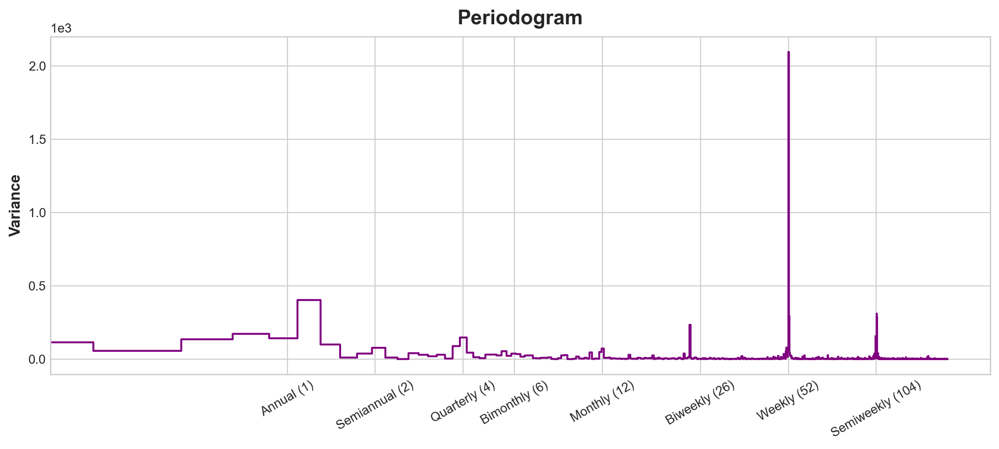

In [18]:
plot_periodogram(average_sales);

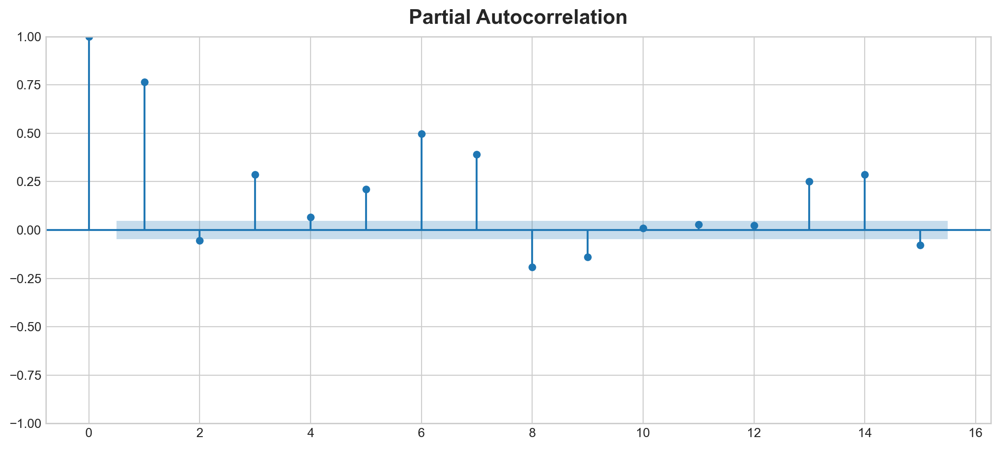

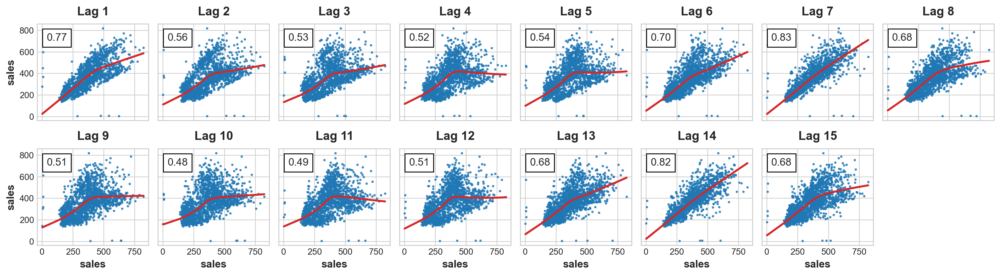

In [19]:
from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(average_sales, lags=15);
plot_lags(average_sales, lags=15, nrows=2);

=> từ biểu đồ trên các ngành chính trong tệp dữ liệu thường là ngành tạp hóa mua bán , mua sắm , tiêu dùng hằng ngày nên tôi sẽ sử dụng mùa vụ 7 ngày/ tuần để quan sát  

                 sales  week  day_of_week  month  day_of_month  year  \
date                                                                   
2013-01-01    1.409438     1            1      1             1  2013   
2013-01-02  278.390807     1            2      1             2  2013   
2013-01-03  202.840197     1            3      1             3  2013   
2013-01-04  198.911154     1            4      1             4  2013   
2013-01-05  267.873244     1            5      1             5  2013   
...                ...   ...          ...    ...           ...   ...   
2017-08-11  463.733851    32            4      8            11  2017   
2017-08-12  444.798280    32            5      8            12  2017   
2017-08-13  485.768618    32            6      8            13  2017   
2017-08-14  427.004717    33            0      8            14  2017   
2017-08-15  427.980884    33            1      8            15  2017   

            day_of_year  week_of_year  
date                   

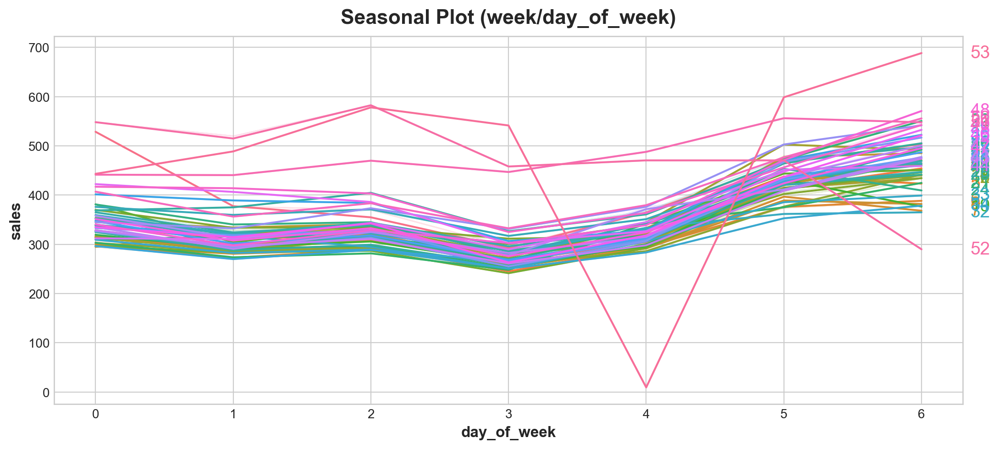

In [20]:
X = average_sales.to_frame()
X["week"] = X.index.week
X["day_of_week"] = X.index.dayofweek
X['month'] = X.index.month
X['day_of_month'] = X.index.day
X['year'] = X.index.year
X['day_of_year'] = X.index.dayofyear
X['week_of_year'] = X.index.weekofyear
print(X)
seasonal_plot(X, y='sales', period='week', freq='day_of_week');

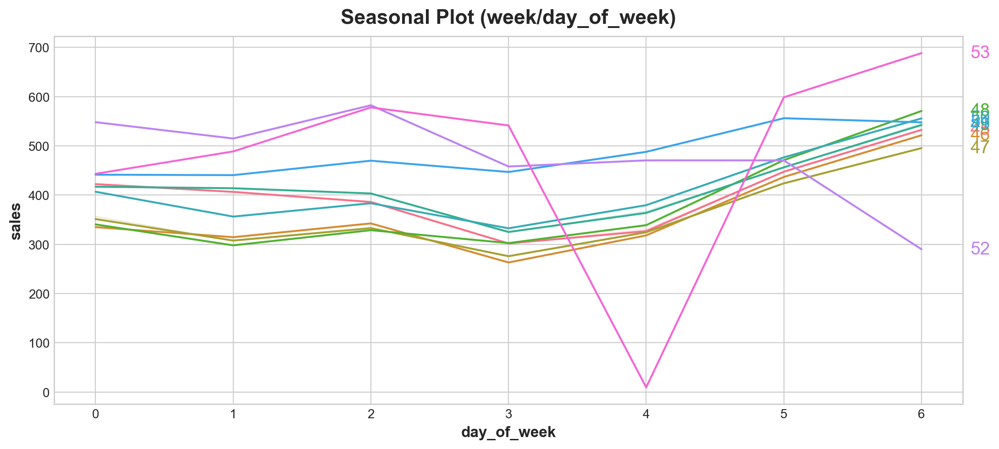

In [21]:
seasonal_plot(X[X['week'] >44], y='sales', period='week', freq='day_of_week');

Tuần thứ 51 52 53 có biểu hiện không theo mùa vụ 

In [22]:
holidays[holidays.index.week>50]

,type,locale,locale_name,description,transferred
date,,,,,
2012-12-21,Additional,National,Ecuador,Navidad-4,False
2012-12-22,Holiday,Local,Salinas,Cantonizacion de Salinas,False
2012-12-22,Additional,National,Ecuador,Navidad-3,False
2012-12-23,Additional,National,Ecuador,Navidad-2,False
2012-12-24,Bridge,National,Ecuador,Puente Navidad,False
2012-12-24,Additional,National,Ecuador,Navidad-1,False
2012-12-25,Holiday,National,Ecuador,Navidad,False
2012-12-26,Additional,National,Ecuador,Navidad+1,False
2013-12-21,Additional,National,Ecuador,Navidad-4,False


giải thích là vào tuần giáng sinh quốc gia này nghỉ lễ trên toàn quốc 

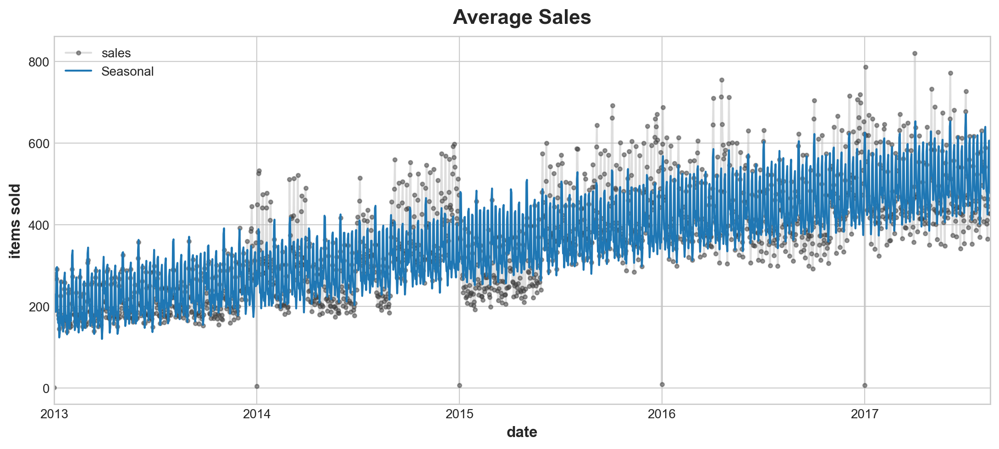

In [23]:
y = average_sales.copy()

fourier_weekly = CalendarFourier(freq='W', order=2)
fourier_monthly = CalendarFourier(freq='M', order=4)

dp = DeterministicProcess(
    index=y.index,
    constant=True,
    order=1,
    seasonal=True,
    additional_terms=[fourier_weekly, fourier_monthly],
    drop=True,
)

X = dp.in_sample()
model = LinearRegression().fit(X, y)
y_pred = pd.Series(
    model.predict(X),
    index=X.index,
    name='Fitted',
)

y_pred = pd.Series(model.predict(X), index=X.index)
ax = y.plot(**plot_params, alpha=0.5, title="Average Sales", ylabel="items sold")
ax = y_pred.plot(ax=ax, label="Seasonal")
ax.legend();

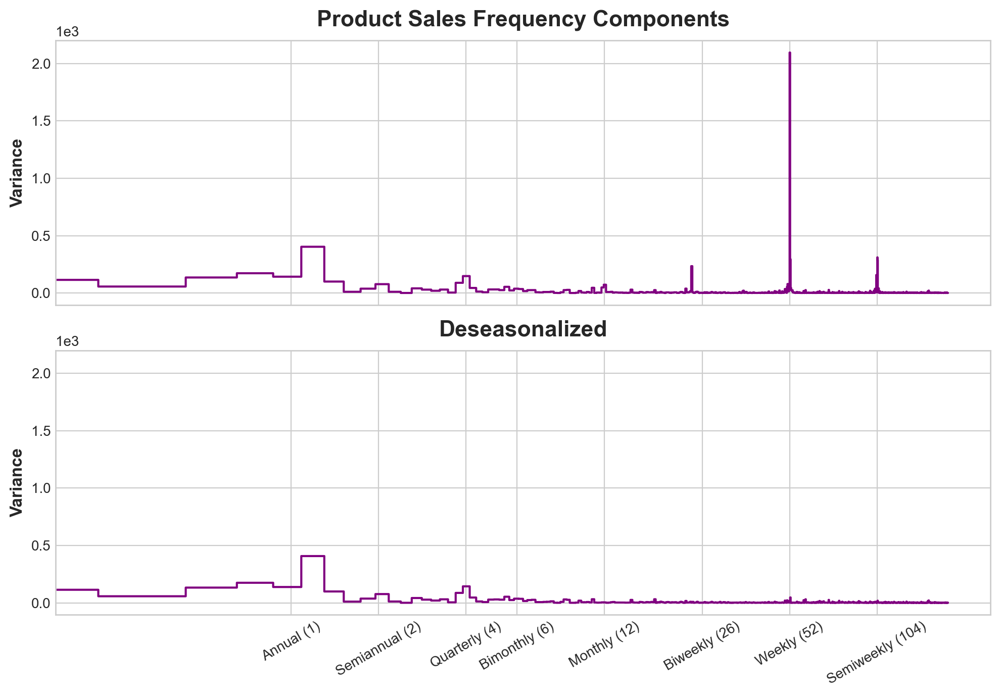

In [24]:
y_deseason = y - y_pred
simplefilter("ignore")
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(10, 7))
ax1 = plot_periodogram(y, ax=ax1)
ax1.set_title("Product Sales Frequency Components")
ax2 = plot_periodogram(y_deseason, ax=ax2);
ax2.set_title("Deseasonalized");

periodogram cho thấy tính năng season có hiệu quả 

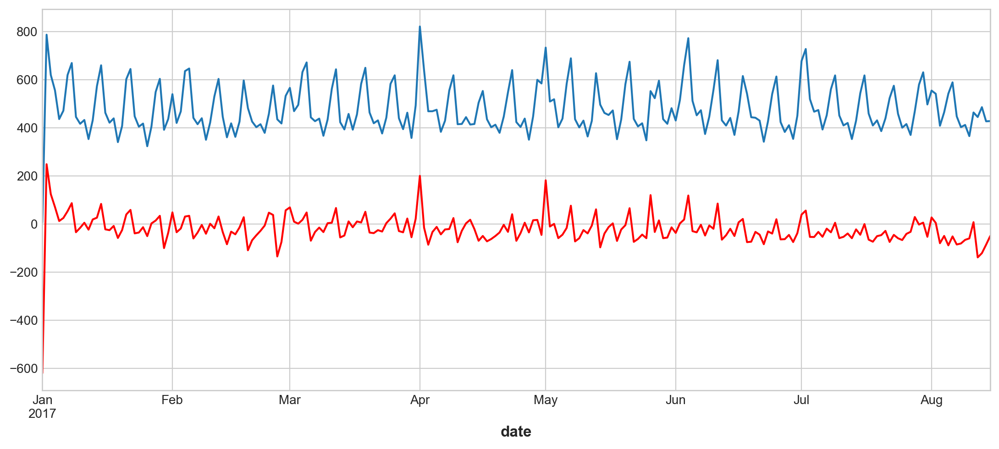

In [25]:
ax = y_deseason['2017':].plot(color='red')
ax = y['2017':].plot()

In [26]:
y_deseason

date
2013-01-01   -201.781943
2013-01-02     49.228645
2013-01-03     16.137085
2013-01-04      6.555148
2013-01-05    -26.456777
                 ...    
2017-08-11      7.770043
2017-08-12   -138.391951
2017-08-13   -120.876460
2017-08-14    -85.765600
2017-08-15    -49.221927
Freq: D, Length: 1684, dtype: float64

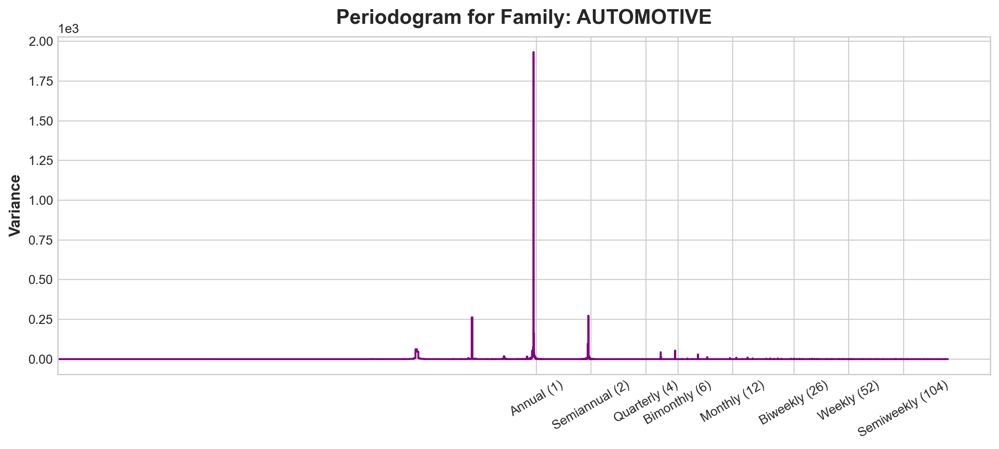

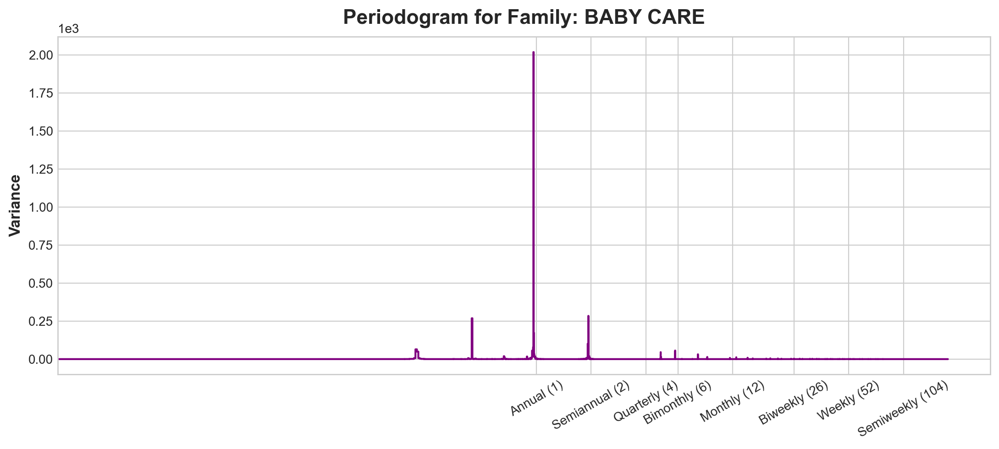

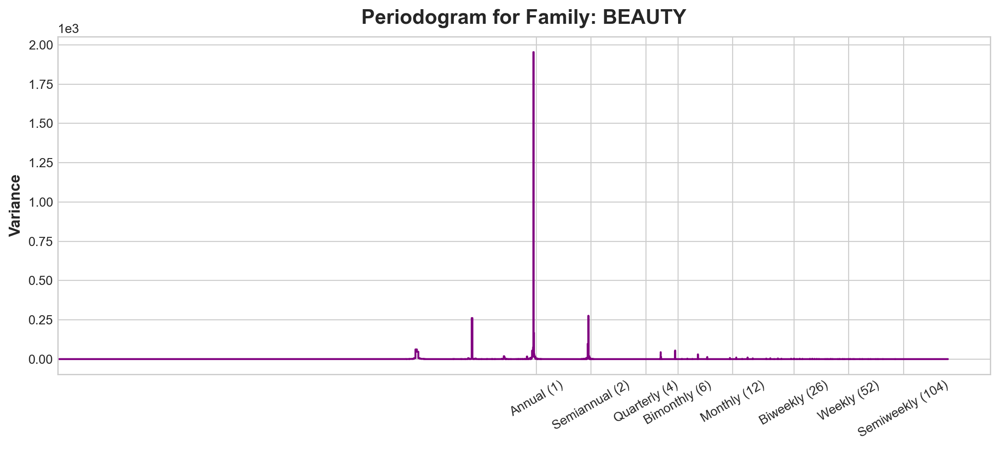

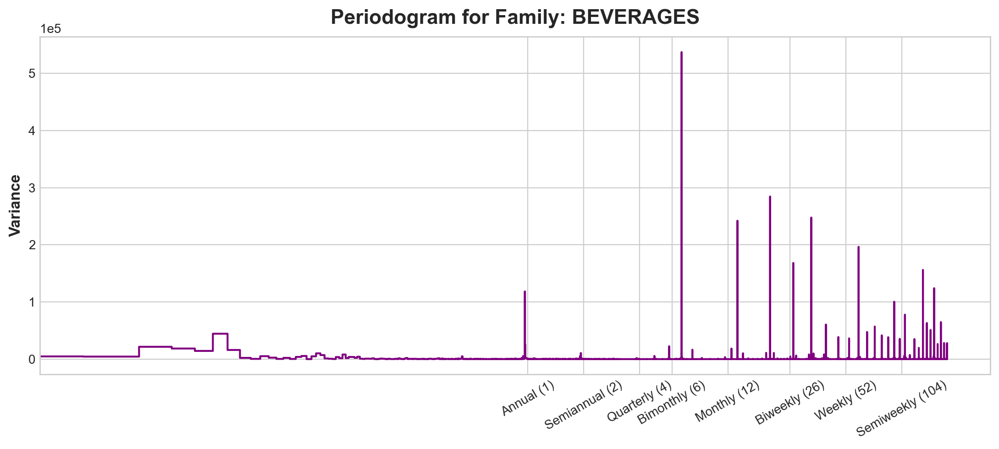

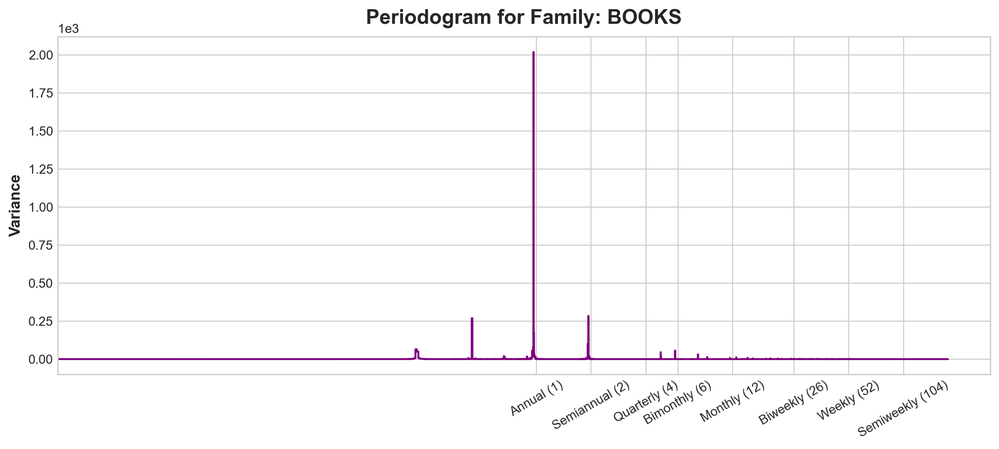

...

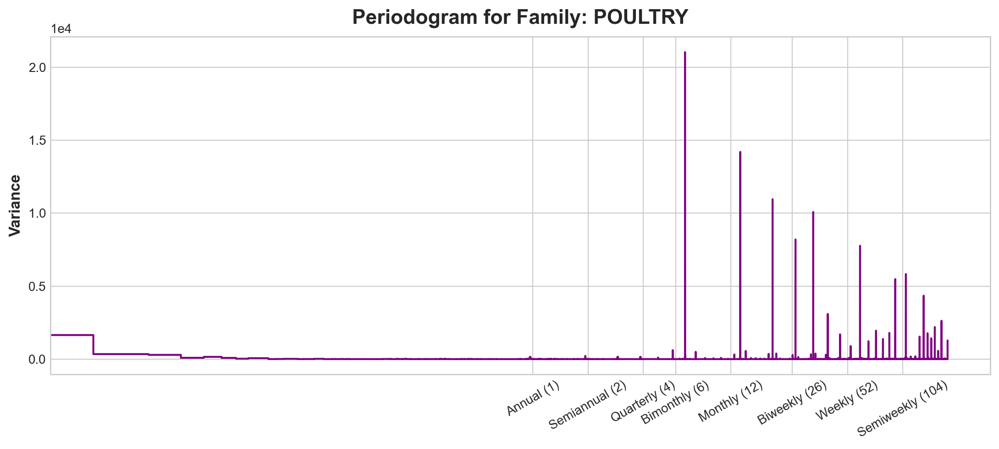

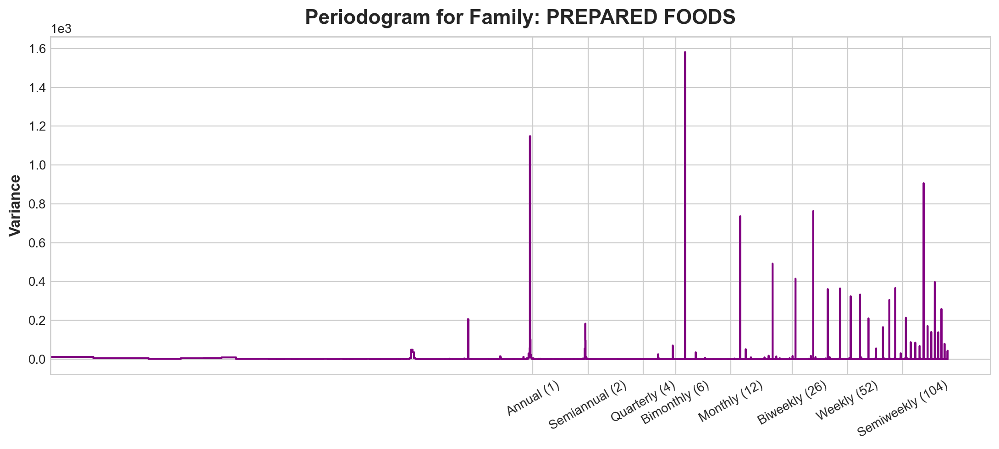

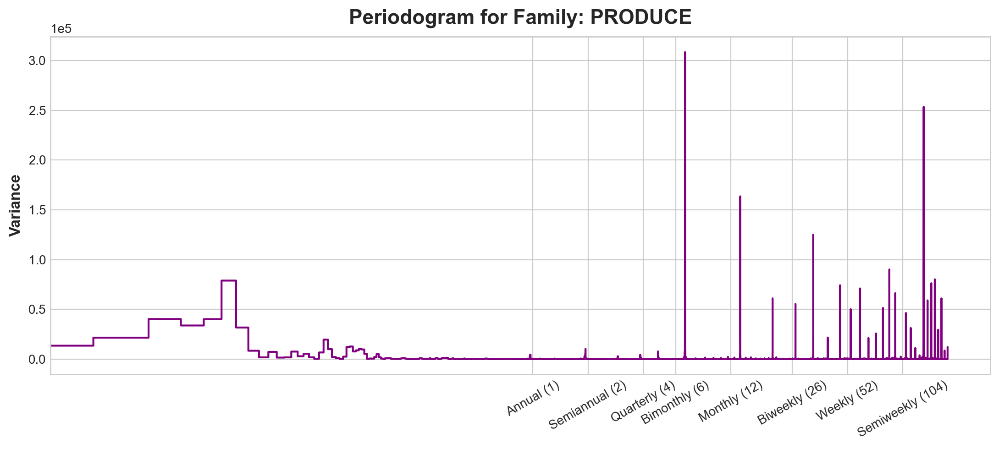

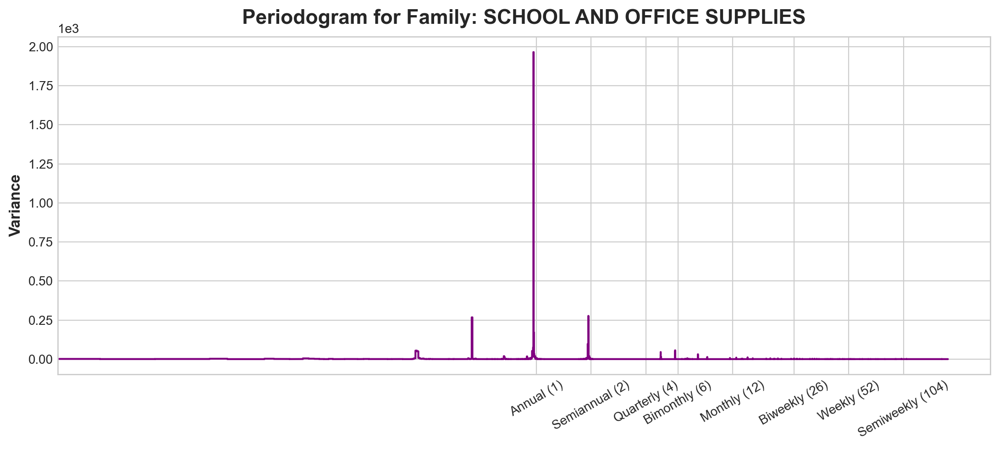

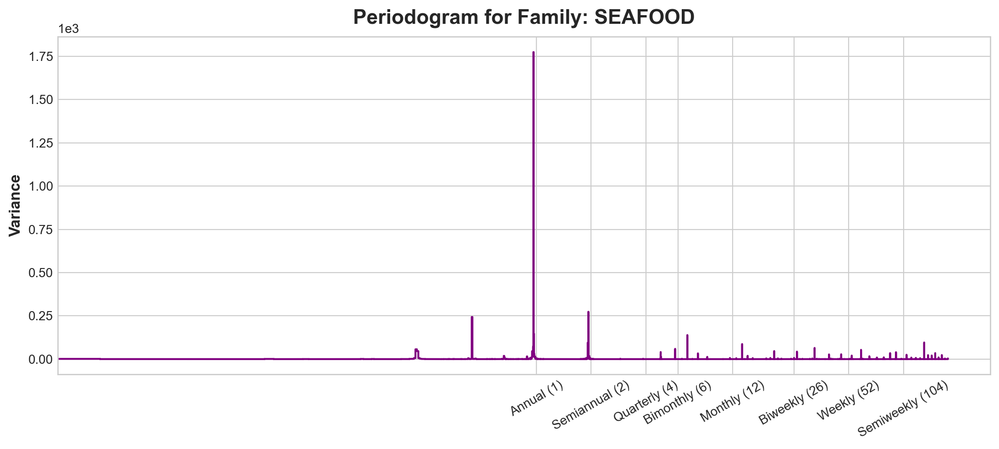

In [27]:
simplefilter("ignore")
for  name,X in train.groupby('family'):
    # Tính toán seasonal decomposition cho nhóm hiện tại
    plot_periodogram(X['sales']-y_pred)
    plt.title(f'Periodogram for Family: {name}')

Yếu tố mùa vụ đã được loại bỏ nhưng vẫn có thể thấy hành vi tuần hoàn của một vài tính năng, để chứng minh điều trên tôi sẽ thử loại bỏ tính mùa vụ của 1 tính năng để quan sát 

In [28]:
family_sales = (
    train
    .groupby(['family', 'date'])
    .mean() 
    .unstack('family')
    .loc['2017':, ['sales', 'onpromotion']]
)

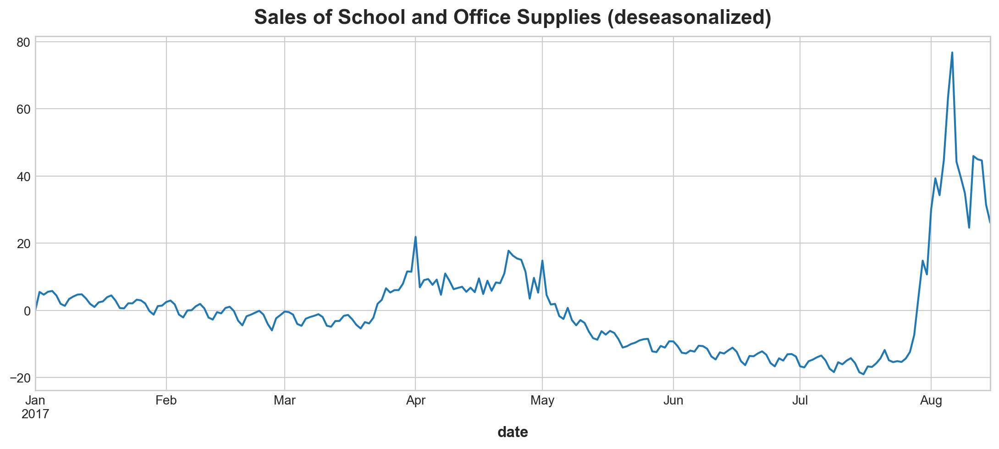

In [29]:
supply_sales = family_sales.loc(axis=1)[:, 'SCHOOL AND OFFICE SUPPLIES']
y = supply_sales.loc[:, 'sales'].squeeze()

fourier = CalendarFourier(freq='W', order=2)
dp = DeterministicProcess(
    constant=True,
    index=y.index,
    order=1,
    seasonal=True,
    drop=True,
    additional_terms=[fourier],
)
X_time = dp.in_sample()
X_time['NewYearsDay'] = (X_time.index.dayofyear == 1)

model = LinearRegression(fit_intercept=False)
model.fit(X_time, y)
y_deseason = y - model.predict(X_time)
y_deseason.name = 'sales_deseasoned'

ax = y_deseason.plot()
ax.set_title("Sales of School and Office Supplies (deseasonalized)");

In [30]:
X_time

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)",NewYearsDay
date,,,,,,,,,
2017-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,True
2017-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,False
2017-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,False
2017-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,False
2017-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,False
...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,223.0,0.0,0.0,0.0,0.0,1.0,0.0,False
2017-08-12,1.0,224.0,0.0,0.0,0.0,0.0,0.0,1.0,False
2017-08-13,1.0,225.0,0.0,0.0,0.0,0.0,0.0,0.0,False


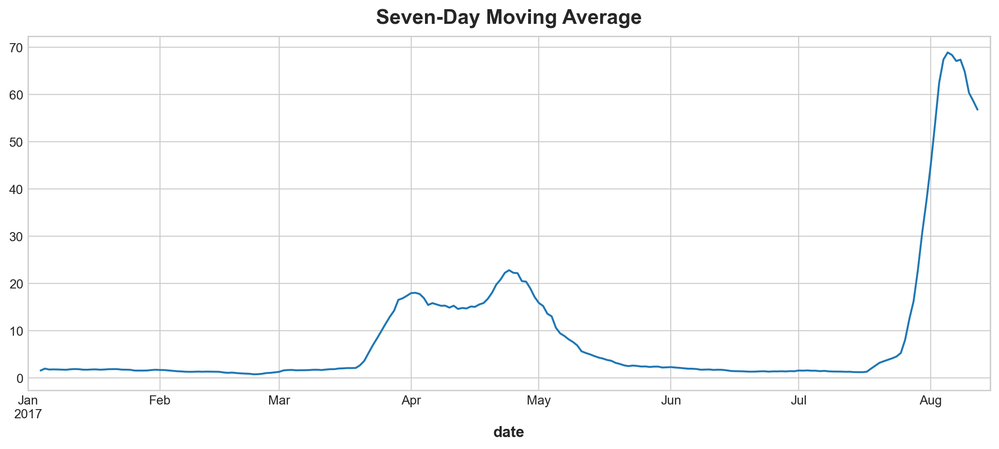

In [31]:
# YOUR CODE HERE
y_ma = y.rolling(7, center=True).mean()

ax = y_ma.plot()
ax.set_title("Seven-Day Moving Average");


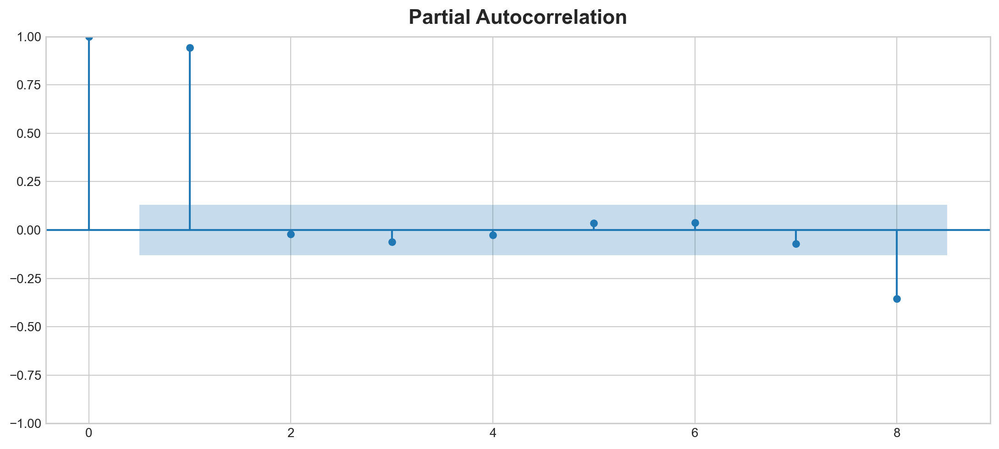

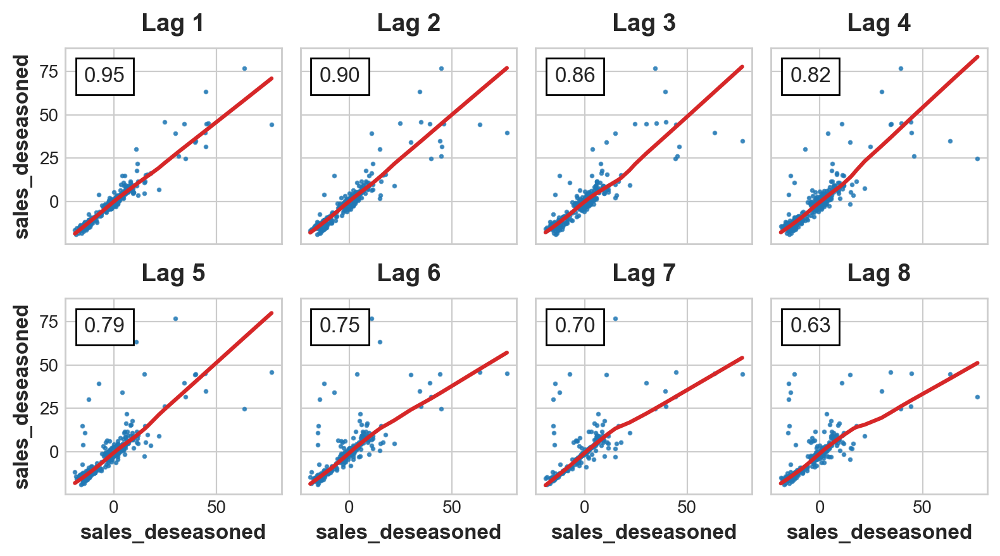

In [32]:
from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(y_deseason, lags=8);
plot_lags(y_deseason, lags=8, nrows=2);

# 3. DATA PROCESSING 

In [33]:
from sklearn.preprocessing import OneHotEncoder,LabelEncoder

def one_hot_encode(dataframe):
    # Lấy index của DataFrame
    original_index = dataframe.index
    
    # Lọc các cột không phải kiểu số hoặc boolean
    columns_to_encode = dataframe.select_dtypes(include=['object', 'bool']).columns
    if 'date' in columns_to_encode:
        columns_to_encode = columns_to_encode.drop('date')
    # Mã hóa dữ liệu
    encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
    encoded_data = encoder.fit_transform(dataframe[columns_to_encode])
    encoded_columns = encoder.get_feature_names_out(columns_to_encode)
    encoded_dataframe = pd.DataFrame(encoded_data, columns=encoded_columns, index=original_index)
    
    # Kết hợp DataFrame gốc và DataFrame đã mã hóa
    combined_dataframe = pd.concat([dataframe.drop(columns=columns_to_encode), encoded_dataframe], axis=1)
    
    return combined_dataframe
def label_encode(dataframe):
    # Lấy index của DataFrame
    original_index = dataframe.index
    
    # Lọc các cột không phải kiểu số hoặc boolean
    columns_to_encode = dataframe.select_dtypes(include=['object', 'bool']).columns
    if 'date' in columns_to_encode:
        columns_to_encode = columns_to_encode.drop('date')
    
    # Mã hóa dữ liệu
    encoder = LabelEncoder()
    encoded_dataframe = dataframe.copy()  # Tạo một bản sao của DataFrame để tránh ảnh hưởng đến dữ liệu gốc
    for column in columns_to_encode:
        encoded_dataframe[column] = encoder.fit_transform(dataframe[column])
    
    # Gán lại index
    encoded_dataframe.index = original_index
    return encoded_dataframe

In [34]:
stores=stores.rename(columns={"type": "stores_type"}) 
holidays=holidays.rename(columns={"type": "holiday_type"}) 

In [35]:
train.drop(columns=["id"],inplace=True)
train = train.set_index(['store_nbr', 'family'],append=True).sort_index()
store_sales = (
    train
    .groupby(['store_nbr','family','date'])
    .mean() 
    .unstack(['store_nbr','family'])
)
store_sales

sales                                                \
store_nbr          1                                                  
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2013-01-01        0.0       0.0    0.0       0.0   0.0      0.00000   
2013-01-02        2.0       0.0    2.0    1091.0   0.0    470.65200   
2013-01-03        3.0       0.0    0.0     919.0   0.0    310.65500   
2013-01-04        3.0       0.0    3.0     953.0   0.0    198.36600   
2013-01-05        5.0       0.0    3.0    1160.0   0.0    301.05700   
...               ...       ...    ...       ...   ...          ...   
2017-08-11        1.0       0.0    1.0    1006.0   0.0    145.60700   
2017-08-12        6.0       0.0    3.0    1659.0   0.0    243.22000   
2017-08-13        1.0       0.0    1.0     803.0   0.0    136.67900   
2017-08-14        1.0       0.0    6.0    2201.0   0.0    346.03800   
2017-08-15        4.0       0.0    4.0    1942.0   0.0    329.54102   

                                                 ... onpromotion        \
store_nbr                                        ...          54         
family     CELEBRATION CLEANING  DAIRY     DELI  ...   MAGAZINES MEATS   
date                                             ...                     
2013-01-01         0.0      0.0    0.0    0.000  ...         0.0   0.0   
2013-01-02         0.0   1060.0  579.0  164.069  ...         0.0   0.0   
2013-01-03         0.0    836.0  453.0  151.582  ...         0.0   0.0   
2013-01-04         0.0    827.0  460.0  131.411  ...         0.0   0.0   
2013-01-05         0.0    811.0  464.0  118.613  ...         0.0   0.0   
...                ...      ...    ...      ...  ...         ...   ...   
2017-08-11         4.0    341.0  343.0   64.302  ...         0.0   0.0   
2017-08-12         3.0    351.0  526.0   99.488  ...         0.0   0.0   
2017-08-13         1.0    169.0  266.0   47.770  ...         0.0   0.0   
2017-08-14         4.0    571.0  699.0  154.578  ...         0.0   0.0   
2017-08-15        21.0    703.0  602.0  116.402  ...         0.0   0.0   

                                                                       \
store_nbr                                                               
family     PERSONAL CARE PET SUPPLIES PLAYERS AND ELECTRONICS POULTRY   
date                                                                    
2013-01-01           0.0          0.0                     0.0     0.0   
2013-01-02           0.0          0.0                     0.0     0.0   
2013-01-03           0.0          0.0                     0.0     0.0   
2013-01-04           0.0          0.0                     0.0     0.0   
2013-01-05           0.0          0.0                     0.0     0.0   
...                  ...          ...                     ...     ...   
2017-08-11           6.0          0.0                     0.0    10.0   
2017-08-12           5.0          0.0                     0.0     0.0   
2017-08-13           6.0          0.0                     0.0     0.0   
2017-08-14           6.0          0.0                     0.0     0.0   
2017-08-15           5.0          0.0                     0.0     0.0   

                                                                      
store_nbr                                                             
family     PREPARED FOODS PRODUCE SCHOOL AND OFFICE SUPPLIES SEAFOOD  
date                                                                  
2013-01-01            0.0     0.0                        0.0     0.0  
2013-01-02            0.0     0.0                        0.0     0.0  
2013-01-03            0.0     0.0                        0.0     0.0  
2013-01-04            0.0     0.0                        0.0     0.0  
2013-01-05            0.0     0.0                        0.0     0.0  
...                   ...     ...                        ...     ...  
2017-08-11            0.0     3.0

### Create trend and season feature

In [36]:
from sklearn.linear_model import LinearRegression
y = store_sales['sales']

fourier_weekly = CalendarFourier(freq='W', order=2)
fourier_monthly = CalendarFourier(freq='M', order=4)

dp = DeterministicProcess(
    index=y.index,
    constant=True,
    order=1,
    seasonal=True,
    additional_terms=[fourier_weekly, fourier_monthly],
    drop=True,
)
X_time = dp.in_sample()
X_time['NewYearsDay'] = (X_time.index.dayofyear == 1)
X_time_test = dp.out_of_sample(steps = 16)
X_time_test['NewYearsDay'] = (X_time_test.index.dayofyear == 1)

In [37]:
X_time

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=W-SUN)","cos(1,freq=W-SUN)",...,"cos(2,freq=W-SUN)","sin(1,freq=M)","cos(1,freq=M)","sin(2,freq=M)","cos(2,freq=M)","sin(3,freq=M)","cos(3,freq=M)","sin(4,freq=M)","cos(4,freq=M)",NewYearsDay
date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.781831,0.623490,...,-0.222521,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,True
2013-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.974928,-0.222521,...,-0.900969,0.201299,0.979530,0.394356,0.918958,0.571268,0.820763,0.724793,0.688967,False
2013-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.433884,-0.900969,...,0.623490,0.394356,0.918958,0.724793,0.688967,0.937752,0.347305,0.998717,-0.050649,False
2013-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.433884,-0.900969,...,0.623490,0.571268,0.820763,0.937752,0.347305,0.968077,-0.250653,0.651372,-0.758758,False
2013-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.974928,-0.222521,...,-0.900969,0.724793,0.688967,0.998717,-0.050649,0.651372,-0.758758,-0.101168,-0.994869,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,1680.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.433884,-0.900969,...,0.623490,0.897805,-0.440394,-0.790776,-0.612106,-0.201299,0.979530,0.968077,-0.250653,False
2017-08-12,1.0,1681.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.974928,-0.222521,...,-0.900969,0.790776,-0.612106,-0.968077,-0.250653,0.394356,0.918958,0.485302,-0.874347,False
2017-08-13,1.0,1682.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.781831,0.623490,...,-0.222521,0.651372,-0.758758,-0.988468,0.151428,0.848644,0.528964,-0.299363,-0.954139,False


tôi tạo lag và lead cho giá dầu và ngày giảm giá để hiểu về tính tuần hoàn  

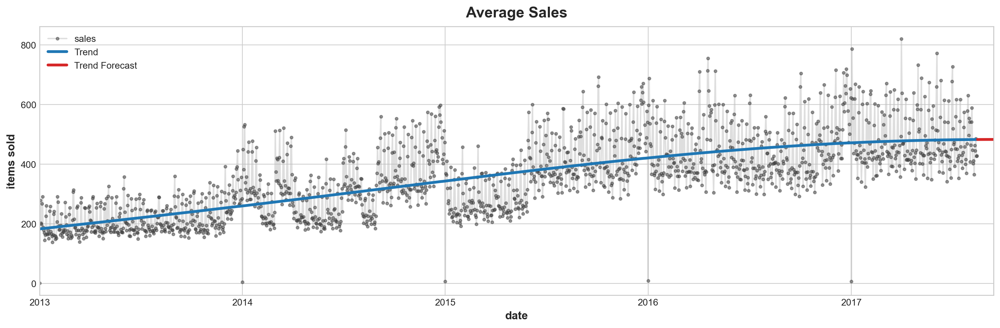

In [38]:
y_trend=train.groupby('date')['sales'].mean()
dp = DeterministicProcess(index=y_trend.index, order=5)
X_trend = dp.in_sample()
X_fore_trend = dp.out_of_sample(steps=30)
model = LinearRegression()
model.fit(X_trend, y_trend)

y_pred_trend = pd.Series(model.predict(X_trend), index=X_trend.index)
y_fore_trend = pd.Series(model.predict(X_fore_trend), index=X_fore_trend.index)

plt.figure(figsize=(15, 5))
ax = y_trend.plot(**plot_params, alpha=0.5, title="Average Sales", ylabel="items sold")
ax = y_pred_trend.plot(ax=ax, linewidth=3, label="Trend", color='C0')
ax = y_fore_trend.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C3')
ax.legend();

In [39]:
y_pred_trend.name = 'trend_feature'
X_time = X_time.join(y_pred_trend, how='inner')
X_time=label_encode(X_time)
X_time.head()

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=W-SUN)","cos(1,freq=W-SUN)",...,"sin(1,freq=M)","cos(1,freq=M)","sin(2,freq=M)","cos(2,freq=M)","sin(3,freq=M)","cos(3,freq=M)","sin(4,freq=M)","cos(4,freq=M)",NewYearsDay,trend_feature
date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.781831,0.623490,...,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,183.013946
2013-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.974928,-0.222521,...,0.201299,0.979530,0.394356,0.918958,0.571268,0.820763,0.724793,0.688967,0,183.219156
2013-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.433884,-0.900969,...,0.394356,0.918958,0.724793,0.688967,0.937752,0.347305,0.998717,-0.050649,0,183.424357
2013-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.433884,-0.900969,...,0.571268,0.820763,0.937752,0.347305,0.968077,-0.250653,0.651372,-0.758758,0,183.629550
2013-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.974928,-0.222521,...,0.724793,0.688967,0.998717,-0.050649,0.651372,-0.758758,-0.101168,-0.994869,0,183.834736


### Create promo feature

In [40]:
onpromotion_test = (
    test
    .groupby(['store_nbr','family','date'])
    ['onpromotion']
    .mean() 
    .unstack(['store_nbr','family'])
)

In [41]:
onpromotion = pd.concat([store_sales['onpromotion'], onpromotion_test], axis=0)
promo_lag_step = pd.concat([
    make_lags(onpromotion,lags=1,name='promo'),
    make_multistep_target(onpromotion,steps=1,name='promo'),
], axis=1)
    

In [42]:
promo_lag_step =(promo_lag_step
    .stack(['store_nbr','family'])  
    .reset_index(['family','store_nbr'])  
)
onpromotion=(onpromotion
    .stack(['store_nbr','family']) 
    .reset_index(['family','store_nbr'])    
)
promo = onpromotion.merge(promo_lag_step, left_on=["date", "store_nbr",'family'], right_on=["date", "store_nbr",'family'], how="left")
promo=promo.rename(columns={0: "promo"}) 
promo.head()

,store_nbr,family,promo,promo_lag_1,promo_step_1
date,,,,,
2013-01-01,1,AUTOMOTIVE,0.0,NaN,0.0
2013-01-01,1,BABY CARE,0.0,NaN,0.0
2013-01-01,1,BEAUTY,0.0,NaN,0.0
2013-01-01,1,BEVERAGES,0.0,NaN,0.0
2013-01-01,1,BOOKS,0.0,NaN,0.0


### Create calender feature

In [43]:
calendar = pd.DataFrame({"date" : pd.date_range('2013-01-01', '2017-08-31')} )
set_date_index(calendar)
calendar["day_of_week"] = calendar.index.dayofweek
calendar = calendar.merge(oil, left_on="date", right_on="date", how="left") 
calendar['dcoilwtico'].fillna(method='backfill', inplace=True)
oil_lags=make_lags(calendar['dcoilwtico'],4,'oil')
calendar = pd.concat([calendar, oil_lags], axis=1).dropna()
calendar

,day_of_week,dcoilwtico,oil_lag_1,oil_lag_2,oil_lag_3,oil_lag_4
date,,,,,,
2013-01-05,5,93.20,93.12,92.97,93.14,93.14
2013-01-06,6,93.20,93.20,93.12,92.97,93.14
2013-01-07,0,93.20,93.20,93.20,93.12,92.97
2013-01-08,1,93.21,93.20,93.20,93.20,93.12
2013-01-09,2,93.08,93.21,93.20,93.20,93.20
...,...,...,...,...,...,...
2017-08-27,6,46.40,46.40,47.65,47.24,48.45
2017-08-28,0,46.40,46.40,46.40,47.65,47.24
2017-08-29,1,46.46,46.40,46.40,46.40,47.65


In [44]:
national_events = holidays[holidays.locale == 'National']
calendar= pd.merge(calendar, national_events,  left_on="date", right_on="date", how="left")

In [45]:
calendar['work_day'] = 1
calendar.loc[calendar.day_of_week> 4, 'work_day'] = 0 
calendar.loc[calendar.holiday_type == 'Work Day', 'work_day'] = 1
calendar.loc[calendar.holiday_type == 'Transfer', 'work_day'] = 0
calendar.loc[calendar.holiday_type == 'Bridge', 'work_day'] = 0 
calendar.loc[(calendar.holiday_type == 'Holiday') & (calendar.transferred == False), 'work_day'] = 0 
calendar.loc[(calendar.holiday_type == 'Holiday') & (calendar.transferred == True), 'work_day'] = 1

In [46]:
calendar.drop(columns=['locale_name','description','locale','day_of_week'],inplace=True)
calendar=one_hot_encode(calendar)
calendar.fillna(0, inplace=True)
calendar

,dcoilwtico,oil_lag_1,oil_lag_2,oil_lag_3,oil_lag_4,work_day,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_type_nan,transferred_False,transferred_True,transferred_nan
date,,,,,,,,,,,,,,,,
2013-01-05,93.20,93.12,92.97,93.14,93.14,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
2013-01-06,93.20,93.20,93.12,92.97,93.14,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2013-01-07,93.20,93.20,93.20,93.12,92.97,1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2013-01-08,93.21,93.20,93.20,93.20,93.12,1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2013-01-09,93.08,93.21,93.20,93.20,93.20,1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-27,46.40,46.40,47.65,47.24,48.45,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2017-08-28,46.40,46.40,46.40,47.65,47.24,1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2017-08-29,46.46,46.40,46.40,46.40,47.65,1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


### Create stores feature 

In [47]:
stores_encoded=label_encode(stores)
stores_encoded.head()

,store_nbr,city,state,stores_type,cluster
0,1,18,12,3,13
1,2,18,12,3,13
2,3,18,12,3,8
3,4,18,12,3,9
4,5,21,14,3,4


In [48]:
stores_info=pd.DataFrame(index=train.index )
stores_info=stores_info.reset_index(['family','store_nbr'])


In [49]:
stores_info=stores_info.merge(transactions, left_on=["date", "store_nbr"], right_on=["date", "store_nbr"], how="left")
stores_info=stores_info.merge(stores_encoded, left_on="store_nbr", right_on="store_nbr", how="left").set_index(stores_info.index)

In [50]:
stores_info

,store_nbr,family,transactions,city,state,stores_type,cluster
date,,,,,,,
2013-01-01,1,AUTOMOTIVE,NaN,18,12,3,13
2013-01-01,1,BABY CARE,NaN,18,12,3,13
2013-01-01,1,BEAUTY,NaN,18,12,3,13
2013-01-01,1,BEVERAGES,NaN,18,12,3,13
2013-01-01,1,BOOKS,NaN,18,12,3,13
...,...,...,...,...,...,...,...
2017-08-15,54,POULTRY,802.0,5,10,2,3
2017-08-15,54,PREPARED FOODS,802.0,5,10,2,3
2017-08-15,54,PRODUCE,802.0,5,10,2,3


In [51]:
stores_info.fillna(0, inplace=True)

In [53]:
X=  pd.merge(stores_info, calendar, how='inner', left_on="date", right_on="date")
X= pd.merge(promo, X, how='inner', left_on=['date','store_nbr','family'], right_on=['date','store_nbr','family'])
X=pd.merge(X, X_time, how='inner', left_on="date", right_on="date")

In [54]:
X["week"] =X.index.week
X["day_of_week"] = X.index.dayofweek
X['month'] = X.index.month
X['day_of_month'] = X.index.day
X['year'] = X.index.year
X['day_of_year'] = X.index.dayofyear
X['week_of_year'] = X.index.weekofyear
X

,store_nbr,family,promo,promo_lag_1,promo_step_1,transactions,city,state,stores_type,cluster,...,"cos(4,freq=M)",NewYearsDay,trend_feature,week,day_of_week,month,day_of_month,year,day_of_year,week_of_year
date,,,,,,,,,,,,,,,,,,,,,
2013-01-05,1,AUTOMOTIVE,0.0,0.0,0.0,1509.0,18,12,3,13,...,-0.994869,0,183.834736,1,5,1,5,2013,5,1
2013-01-05,1,BABY CARE,0.0,0.0,0.0,1509.0,18,12,3,13,...,-0.994869,0,183.834736,1,5,1,5,2013,5,1
2013-01-05,1,BEAUTY,0.0,0.0,0.0,1509.0,18,12,3,13,...,-0.994869,0,183.834736,1,5,1,5,2013,5,1
2013-01-05,1,BEVERAGES,0.0,0.0,0.0,1509.0,18,12,3,13,...,-0.994869,0,183.834736,1,5,1,5,2013,5,1
2013-01-05,1,BOOKS,0.0,0.0,0.0,1509.0,18,12,3,13,...,-0.994869,0,183.834736,1,5,1,5,2013,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-15,54,POULTRY,0.0,0.0,0.0,802.0,5,10,2,3,...,0.347305,0,482.962806,33,1,8,15,2017,227,33
2017-08-15,54,PREPARED FOODS,0.0,0.0,0.0,802.0,5,10,2,3,...,0.347305,0,482.962806,33,1,8,15,2017,227,33
2017-08-15,54,PRODUCE,76.0,3.0,76.0,802.0,5,10,2,3,...,0.347305,0,482.962806,33,1,8,15,2017,227,33


In [55]:
null_values = X.isnull()
null_counts = null_values.sum()
columns_with_null = null_counts[null_counts > 0]
if not columns_with_null.empty:
    print("Các cột có giá trị null:")
    print(columns_with_null)
else:
    print("Không có cột nào có giá trị null.")

Không có cột nào có giá trị null.


In [56]:
X=X.set_index(['store_nbr', 'family'],append=True).sort_index()
X = X.groupby(['store_nbr', 'family','date']).mean().unstack(['store_nbr','family'])

In [57]:
#X= X.loc[:,:,'2017':]
X=X.loc['2017':]
X


promo                                                \
store_nbr          1                                                  
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2017-01-01        0.0       0.0    0.0       0.0   0.0          0.0   
2017-01-02        0.0       0.0    0.0      31.0   0.0          2.0   
2017-01-03        0.0       0.0    1.0      42.0   0.0          2.0   
2017-01-04        0.0       0.0    1.0      54.0   0.0          8.0   
2017-01-05        0.0       0.0    2.0      32.0   0.0          7.0   
...               ...       ...    ...       ...   ...          ...   
2017-08-11        0.0       0.0    1.0       3.0   0.0          8.0   
2017-08-12        0.0       0.0    1.0       7.0   0.0          6.0   
2017-08-13        0.0       0.0    0.0       5.0   0.0          6.0   
2017-08-14        0.0       0.0    1.0       9.0   0.0          9.0   
2017-08-15        0.0       0.0    1.0      11.0   0.0          8.0   

                                             ... week_of_year        \
store_nbr                                    ...           54         
family     CELEBRATION CLEANING DAIRY  DELI  ...    MAGAZINES MEATS   
date                                         ...                      
2017-01-01         0.0      0.0   0.0   0.0  ...         52.0  52.0   
2017-01-02         0.0      7.0  11.0   3.0  ...          1.0   1.0   
2017-01-03         0.0     18.0  14.0   5.0  ...          1.0   1.0   
2017-01-04         1.0     15.0  32.0   5.0  ...          1.0   1.0   
2017-01-05         0.0     10.0  24.0   1.0  ...          1.0   1.0   
...                ...      ...   ...   ...  ...          ...   ...   
2017-08-11         0.0      7.0  14.0  35.0  ...         32.0  32.0   
2017-08-12         0.0      8.0  19.0   3.0  ...         32.0  32.0   
2017-08-13         0.0      5.0  15.0   4.0  ...         32.0  32.0   
2017-08-14         0.0     11.0  23.0   7.0  ...         33.0  33.0   
2017-08-15         0.0     10.0  19.0   5.0  ...         33.0  33.0   

                                                                       \
store_nbr                                                               
family     PERSONAL CARE PET SUPPLIES PLAYERS AND ELECTRONICS POULTRY   
date                                                                    
2017-01-01          52.0         52.0                    52.0    52.0   
2017-01-02           1.0          1.0                     1.0     1.0   
2017-01-03           1.0          1.0                     1.0     1.0   
2017-01-04           1.0          1.0                     1.0     1.0   
2017-01-05           1.0          1.0                     1.0     1.0   
...                  ...          ...                     ...     ...   
2017-08-11          32.0         32.0                    32.0    32.0   
2017-08-12          32.0         32.0                    32.0    32.0   
2017-08-13          32.0         32.0                    32.0    32.0   
2017-08-14          33.0         33.0                    33.0    33.0   
2017-08-15          33.0         33.0                    33.0    33.0   

                                                                      
store_nbr                                                             
family     PREPARED FOODS PRODUCE SCHOOL AND OFFICE SUPPLIES SEAFOOD  
date                                                                  
2017-01-01           52.0    52.0                       52.0    52.0  
2017-01-02            1.0     1.0                        1.0     1.0  
2017-01-03            1.0     1.0                        1.0     1.0  
2017-01-04            1.0     1.0                        1.0     1.0  
2017-01-05            1.0     1.0                        1.0     1.0  
...                   ...     ...                        ...     ...  
2017-08-11           32.0    32.0                       32.0    32.0  
2017-08

In [58]:
y = store_sales['sales']
y = (y
    #.stack(['store_nbr','family'])
    #.reorder_levels(['store_nbr', 'family', y.index.names[0]]).sort_index()
)

y

store_nbr          1                                                 \
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2013-01-01        0.0       0.0    0.0       0.0   0.0      0.00000   
2013-01-02        2.0       0.0    2.0    1091.0   0.0    470.65200   
2013-01-03        3.0       0.0    0.0     919.0   0.0    310.65500   
2013-01-04        3.0       0.0    3.0     953.0   0.0    198.36600   
2013-01-05        5.0       0.0    3.0    1160.0   0.0    301.05700   
...               ...       ...    ...       ...   ...          ...   
2017-08-11        1.0       0.0    1.0    1006.0   0.0    145.60700   
2017-08-12        6.0       0.0    3.0    1659.0   0.0    243.22000   
2017-08-13        1.0       0.0    1.0     803.0   0.0    136.67900   
2017-08-14        1.0       0.0    6.0    2201.0   0.0    346.03800   
2017-08-15        4.0       0.0    4.0    1942.0   0.0    329.54102   

store_nbr                                        ...        54             \
family     CELEBRATION CLEANING  DAIRY     DELI  ... MAGAZINES      MEATS   
date                                             ...                        
2013-01-01         0.0      0.0    0.0    0.000  ...       0.0   0.000000   
2013-01-02         0.0   1060.0  579.0  164.069  ...       0.0  73.771000   
2013-01-03         0.0    836.0  453.0  151.582  ...       0.0  50.257000   
2013-01-04         0.0    827.0  460.0  131.411  ...       0.0  40.223000   
2013-01-05         0.0    811.0  464.0  118.613  ...       0.0  43.431000   
...                ...      ...    ...      ...  ...       ...        ...   
2017-08-11         4.0    341.0  343.0   64.302  ...       0.0  50.756000   
2017-08-12         3.0    351.0  526.0   99.488  ...       1.0  53.079002   
2017-08-13         1.0    169.0  266.0   47.770  ...       3.0  67.435000   
2017-08-14         4.0    571.0  699.0  154.578  ...       1.0  64.224000   
2017-08-15        21.0    703.0  602.0  116.402  ...       2.0  57.842000   

store_nbr                                                                 \
family     PERSONAL CARE PET SUPPLIES PLAYERS AND ELECTRONICS    POULTRY   
date                                                                       
2013-01-01           0.0          0.0                     0.0   0.000000   
2013-01-02         228.0          0.0                     0.0  15.514000   
2013-01-03         156.0          0.0                     0.0   4.313000   
2013-01-04         146.0          0.0                     0.0  26.743000   
2013-01-05         205.0          0.0                     0.0  31.118000   
...                  ...          ...                     ...        ...   
2017-08-11         155.0          0.0                     0.0  80.759000   
2017-08-12         169.0          0.0                     4.0  91.671000   
2017-08-13         244.0          0.0                     2.0  79.062996   
2017-08-14         200.0          0.0                     1.0  56.155000   
2017-08-15         169.0          0.0                     2.0  59.619000   

store_nbr                                                              
family     PREPARED FOODS  PRODUCE SCHOOL AND OFFICE SUPPLIES SEAFOOD  
date                                                                   
2013-01-01            0.0    0.000                        0.0     0.0  
2013-01-02           61.0    0.000                        0.0     3.0  
2013-01-03            1.0    0.000                        0.0     2.0  
2013-01-04           38.0    0.000                        0.0     2.0  
2013-01-05           32.0    0.000                        0.0     1.0  
...                   ...      ...                        ...     ...  
2017-08-11           54.0  546.250                        0.0     0.0  
2017-08-12           81.0  696.920                        0.0     1.0  
2017-08-13           91.0  877.304                        0.0     2.0

In [59]:
y1=y.loc['2017':]

In [60]:
y1

store_nbr          1                                                 \
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2017-01-01        0.0       0.0    0.0       0.0   0.0      0.00000   
2017-01-02        5.0       0.0    0.0    1434.0   0.0    166.81900   
2017-01-03        4.0       0.0    4.0    3081.0   2.0    519.34800   
2017-01-04        1.0       0.0    4.0    3039.0   2.0    543.25100   
2017-01-05        2.0       0.0    3.0    2617.0   0.0    533.48000   
...               ...       ...    ...       ...   ...          ...   
2017-08-11        1.0       0.0    1.0    1006.0   0.0    145.60700   
2017-08-12        6.0       0.0    3.0    1659.0   0.0    243.22000   
2017-08-13        1.0       0.0    1.0     803.0   0.0    136.67900   
2017-08-14        1.0       0.0    6.0    2201.0   0.0    346.03800   
2017-08-15        4.0       0.0    4.0    1942.0   0.0    329.54102   

store_nbr                                         ...        54             \
family     CELEBRATION CLEANING   DAIRY     DELI  ... MAGAZINES      MEATS   
date                                              ...                        
2017-01-01         0.0      0.0     0.0    0.000  ...       0.0   0.000000   
2017-01-02         0.0    332.0   376.0   44.980  ...       1.0  57.447998   
2017-01-03        15.0    952.0  1045.0  209.300  ...       0.0  57.052000   
2017-01-04        17.0   1055.0  1029.0  135.944  ...       0.0  64.540000   
2017-01-05        40.0    918.0   853.0  137.006  ...       0.0  57.417000   
...                ...      ...     ...      ...  ...       ...        ...   
2017-08-11         4.0    341.0   343.0   64.302  ...       0.0  50.756000   
2017-08-12         3.0    351.0   526.0   99.488  ...       1.0  53.079002   
2017-08-13         1.0    169.0   266.0   47.770  ...       3.0  67.435000   
2017-08-14         4.0    571.0   699.0  154.578  ...       1.0  64.224000   
2017-08-15        21.0    703.0   602.0  116.402  ...       2.0  57.842000   

store_nbr                                                                 \
family     PERSONAL CARE PET SUPPLIES PLAYERS AND ELECTRONICS    POULTRY   
date                                                                       
2017-01-01           0.0          0.0                     0.0   0.000000   
2017-01-02         315.0          1.0                     8.0  78.719000   
2017-01-03         291.0          0.0                     6.0  72.347000   
2017-01-04         228.0          0.0                     5.0  43.715000   
2017-01-05         227.0          2.0                     5.0  75.235000   
...                  ...          ...                     ...        ...   
2017-08-11         155.0          0.0                     0.0  80.759000   
2017-08-12         169.0          0.0                     4.0  91.671000   
2017-08-13         244.0          0.0                     2.0  79.062996   
2017-08-14         200.0          0.0                     1.0  56.155000   
2017-08-15         169.0          0.0                     2.0  59.619000   

store_nbr                                                              
family     PREPARED FOODS  PRODUCE SCHOOL AND OFFICE SUPPLIES SEAFOOD  
date                                                                   
2017-01-01            0.0    0.000                        0.0     0.0  
2017-01-02          126.0  475.658                        0.0     8.0  
2017-01-03           53.0  936.004                        0.0     1.0  
2017-01-04           98.0  754.560                        0.0     2.0  
2017-01-05           17.0  370.752                        0.0     0.0  
...                   ...      ...                        ...     ...  
2017-08-11           54.0  546.250                        0.0     0.0  
2017-08-12           81.0  696.920                        0.0     1.0  
2017-08-13           91.0  877.304                     

# 4.Training on my kaggle notebook

#### [Lstm multioutput](https://www.kaggle.com/code/sonhoangvu/lstm-multioutput-time-series)
#### [calendar +seasonality -multioutput](https://www.kaggle.com/code/sonhoangvu/calendar-seasonality-multioutput)